# Lasso cross-validation for photography recovery

author: [Wanghley Soares Martins](https://www.linkedin.com/in/wanghley/)

This notebook explores the use of Lasso regression for recovering a photograph from a noisy version of it. The idea is to use the Lasso regression to recover the original image from a noisy version of it. The Lasso regression is a linear regression with a L1 regularization term. The L1 regularization term is used to enforce sparsity in the solution, i.e., to make the solution have as many zeros as possible. This is useful in the context of image recovery because images are usually sparse in some domain, e.g., the wavelet domain.

In [145]:
import numpy as np
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import RepeatedKFold
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.image as mpimg
import random as rnd
%pip install scikit-image -q
from skimage.util import view_as_windows

Note: you may need to restart the kernel to use updated packages.


## Basis vector geenration functions

In [146]:
def basis_chip(P,Q,u,v):
    x = np.arange(1,P+1)
    y = np.arange(1,Q+1)
    
    X,Y = np.meshgrid(x,y)
    
    # normalizing vector
    alpha_u = np.sqrt(1/P) if u==1 else np.sqrt(2/P)
    beta_v = np.sqrt(1/Q) if v==1 else np.sqrt(2/Q)
    
    chip = alpha_u*beta_v*np.cos((np.pi*((2*X)-1)*(u-1))/(2*P))*np.cos((np.pi*((2*Y)-1)*(v-1))/(2*Q))
    
    return chip
    
    

In [147]:
def basis_vector_matrix(P,Q,uv_orientation=False):
    basis_vector = np.zeros((P**2,1))
    
    if not uv_orientation:
        for vx in range(1,Q+1):
            for uy in range(1,P+1):
                chip = basis_chip(P,Q,uy,vx)
                rasterized_chip = chip.flatten(order='F')
                basis_vector = np.column_stack((basis_vector,rasterized_chip))
    else:
        for uy in range(1,Q+1):
            for vx in range(1,P+1):
                chip = basis_chip(P,Q,uy,vx)
                rasterized_chip = chip.flatten(order='F')
                basis_vector = np.column_stack((basis_vector,rasterized_chip))
    
    basis_vector = basis_vector[:,1:]
    
    return basis_vector
            
            

In [148]:
basisv = basis_vector_matrix(8,8,True)

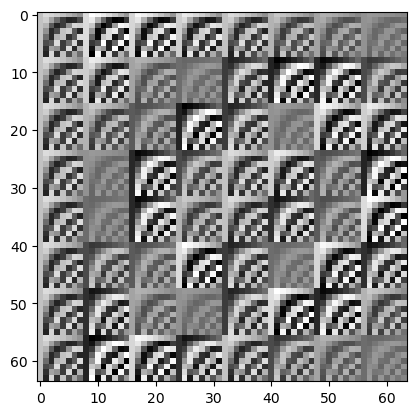

In [149]:
plt.imshow(basisv,cmap='gray')

## K-fold creation

In [150]:
S = 30 # sensed pixels
m = S//6 # test size
M = 20 # training repetition

In [151]:
path = '../assets/boat-8x8-xy-star-30-sensed-px.npy'
corrupt_chip = np.load(path)

In [152]:
# vectorize
y_flat = corrupt_chip.flatten()
indices = np.where(~np.isnan(y_flat))[0] # indices to keep in the matrix (sensed pixels)
indices = indices.astype(int)
y_flat=y_flat[~np.isnan(y_flat)] # remove values nan

In [153]:
basisv_1 = basisv[indices]

In [154]:
rkf = RepeatedKFold(n_splits=4,n_repeats=20)
rkf.get_n_splits(basisv_1,y_flat)

80

### Alpha parameter selection sandbox

In [155]:
alpha = np.logspace(-5,5,11)
image_size = 8  # Size of the corrupted chip (8x8)
basis_size = 64  # Size of the basis matrix (64x64)

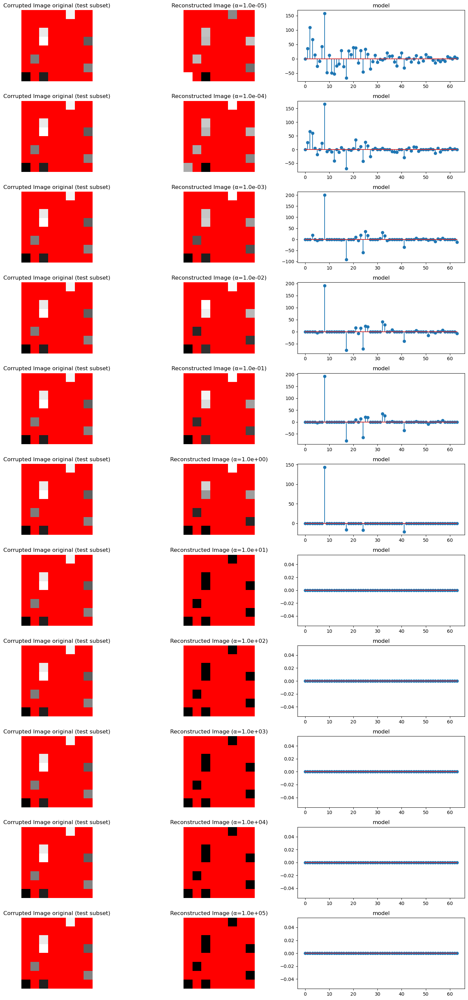

In [156]:
fig, axes = plt.subplots(len(alpha), 3, figsize=(15, 30))
cmap = cm.gray.copy()  # Copy the grayscale colormap
cmap.set_bad(color='red')  # Set NaN values as red
train_index, test_index = next(iter(rkf.split(basisv_1)))

reconstructed_imgs_subset = []
corrupeted_imgs_subset = []

for i, a in enumerate(alpha, start=1):
    # Use only the first random subset
    lasso = Lasso(alpha=a,max_iter=10000)
    lasso.fit(basisv_1[train_index], y_flat[train_index])

    # Reconstruct the image
    reconstructed_chip = np.sum(
        lasso.coef_.reshape(-1, 1, 1) * basisv.T.reshape(-1, image_size, image_size),
        axis=0
    )
    
    # Create a mask for the test subset
    masked_corrupt_chip = np.full_like(corrupt_chip, np.nan)
    for idx in indices[test_index]:  # Use indices array to map back to original image positions
        masked_corrupt_chip.flat[idx] = corrupt_chip.flat[idx]

    # Plot corrupted image
    ax_corrupt = axes[i - 1, 0]
    ax_corrupt.imshow(masked_corrupt_chip, cmap=cmap)
    ax_corrupt.set_title(f"Corrupted Image original (test subset)")
    ax_corrupt.axis("off")
    
    # Create a mask for the test subset
    masked_reconstruct_chip = np.full_like(corrupt_chip, np.nan)
    for idx in indices[test_index]:  # Use indices array to map back to original image positions
        masked_reconstruct_chip.flat[idx] = reconstructed_chip.flat[idx]

    # Plot reconstructed image
    ax_reconstructed = axes[i - 1, 1]
    ax_reconstructed.imshow(masked_reconstruct_chip, cmap=cmap)
    ax_reconstructed.set_title(f"Reconstructed Image (α={a:.1e})")
    ax_reconstructed.axis("off")
    
    ax_weights= axes[i - 1, 2]
    ax_weights.stem(lasso.coef_)
    ax_weights.set_title("model")
    
    reconstructed_imgs_subset.append(masked_reconstruct_chip)
    corrupeted_imgs_subset.append(masked_corrupt_chip)

plt.tight_layout()
plt.show()


By varying the alpha ($\lambda$) parameter, we can see how the image reconstruction changes very clearly. This is a good way to understand the effect of the regularization parameter on the image reconstruction.

Overall, as seen above all reconstructions for a regularized alpha parameter greater than 1.6 are very similar in terms of not restoring/reconstructing the image. This is because the regularization is too strong and the model is not able to learn the underlying structure of the image. However, for very small alpha parameters, the model is not able to learn the underlying structure of the image and the image is not reconstructed looking somewhat like a noisy image. There is a sweet spot in the middle where the image is reconstructed well and the underlying structure is learned. This is the alpha parameter that we want to find. IN this case it is around $4.0e-2$.

In terms of weights, the weights change behavior as the alpha parameter changes. For very small alpha parameters, the weights are very large and the model is not able to learn the underlying structure of the image. For very large alpha parameters, the weights are very small and the model is not able to learn the underlying structure of the image. There is a sweet spot in the middle where the weights are large enough to learn the underlying structure of the image but not too large to overfit the data. This is the alpha parameter that we want to find. In this case it is around $4.0e-2$. Moreover, there is a limit of the most important weights that are used to reconstruct the image. This is because the model is not able to learn the underlying structure of the image and the weights are not used to reconstruct the image.

#### MSE estimation for each alpha parameter

In [157]:
# Initialize list to store MSE values
mse_values = []

# Iterate over pairs of reconstructed and corrupted images
for reconstructed_img, corrupted_img in zip(reconstructed_imgs_subset, corrupeted_imgs_subset):
    # Find valid pixels (ignore NaN values)
    valid_pixels = ~np.isnan(corrupted_img) & ~np.isnan(reconstructed_img)
    
    # Check if there are any valid pixels
    if np.any(valid_pixels):
        # Calculate MSE for valid pixels
        mse = mean_squared_error(corrupted_img[valid_pixels], reconstructed_img[valid_pixels])
        mse_values.append(mse)
    else:
        # If no valid pixels, append NaN and print a warning
        mse_values.append(np.nan)
        print("Warning: No valid pixels found for an image pair. Appending NaN.")

# Calculate the mean of all MSE values, ignoring NaN values
mean_mse = np.nanmean(mse_values)  # Use np.nanmean to ignore NaN values

# Print the results
print("MSE values for each image pair:", mse_values)
print(f"Mean MSE: {mean_mse:.4f}")

MSE values for each image pair: [43451.92479545594, 42348.59120893631, 42000.479769977, 40646.1498435603, 40874.85871155556, 41260.656396267266, 40723.75, 40723.75, 40723.75, 40723.75, 40723.75]
Mean MSE: 41291.0373


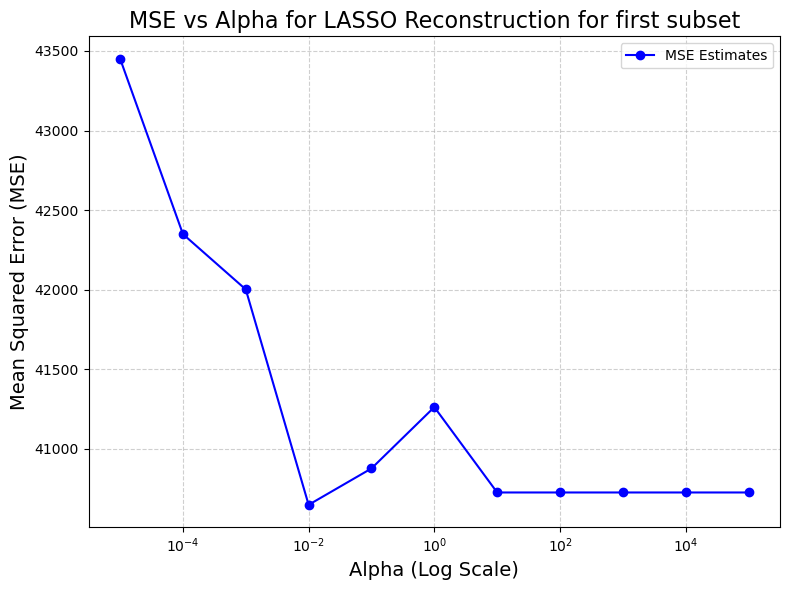

In [158]:
plt.figure(figsize=(8, 6)) 
plt.plot(alpha, mse_values, marker='o', color='b', linestyle='-', markersize=6, label='MSE Estimates')
plt.xscale('log')
plt.xlabel('Alpha (Log Scale)', fontsize=14)
plt.ylabel('Mean Squared Error (MSE)', fontsize=14)
plt.title('MSE vs Alpha for LASSO Reconstruction for first subset', fontsize=16)
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

### Alpha parameter selection streamlined

In [159]:
def find_mse_curves(basisv_1, y_flat, alpha_values, n_splits=4, n_repeats=20):
    rkf = RepeatedKFold(n_splits=n_splits, n_repeats=n_repeats)
    mse_curves = []

    for train_index, test_index in rkf.split(basisv_1):
        mse_values = []
        for alpha in alpha_values:
            lasso = Lasso(alpha=alpha, max_iter=10000)
            lasso.fit(basisv_1[train_index], y_flat[train_index])
            y_pred = lasso.predict(basisv_1[test_index])
            mse_values.append(mean_squared_error(y_flat[test_index], y_pred))
        mse_curves.append(mse_values)

    mse_curves = np.array(mse_curves)
    avg_mse_curve = np.mean(mse_curves, axis=0)
    return mse_curves, avg_mse_curve

In [160]:
alpha_values = np.logspace(-8, 4, 100)
mse_curves, avg_mse_curve = find_mse_curves(basisv_1, y_flat, alpha_values)

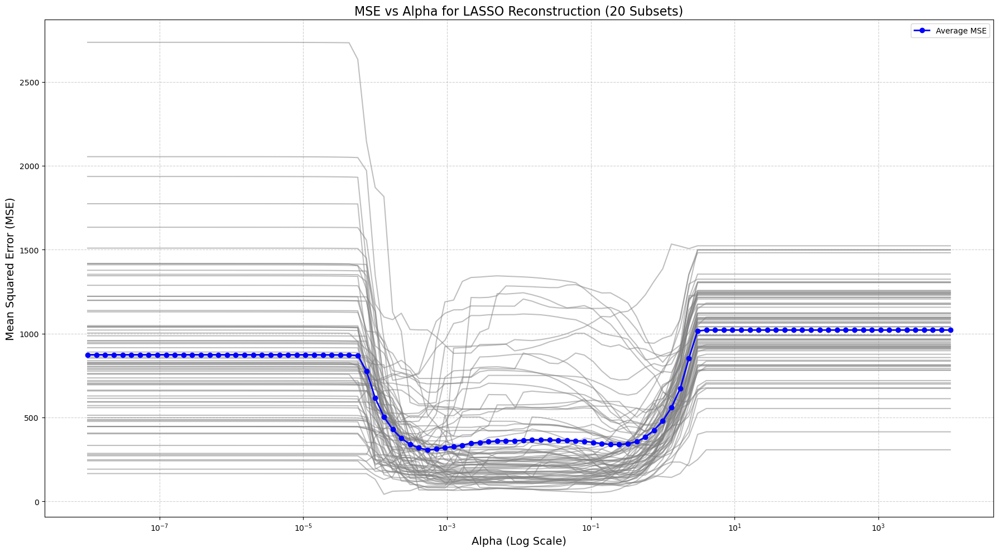

In [161]:
plt.figure(figsize=(18, 10))

# Plot MSE curves for each subset
for mse_curve in mse_curves:
    plt.plot(alpha_values, mse_curve, color='gray', alpha=0.5)

# Plot the average MSE curve
plt.plot(alpha_values, avg_mse_curve, marker='o', color='b', linestyle='-', markersize=6, linewidth=2, label='Average MSE')

plt.xscale('log')
plt.xlabel('Alpha (Log Scale)', fontsize=14)
plt.ylabel('Mean Squared Error (MSE)', fontsize=14)
plt.title('MSE vs Alpha for LASSO Reconstruction (20 Subsets)', fontsize=16)
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

In [162]:
min_index = np.argmin(avg_mse_curve)

In [163]:
best_alpha = alpha_values[min_index]
print(f"Best alpha: {best_alpha:.2e}")

Best alpha: 5.34e-04


# Chip full reconstruction with fine tunned alpha parameter

In [164]:
y_flat = corrupt_chip.flatten()
indices = np.where(~np.isnan(y_flat))[0] # indices to keep in the matrix
indices = indices.astype(int)
y_flat=y_flat[~np.isnan(y_flat)] # remove values nan

In [165]:
vectr_matrix_reshaped = basisv[indices]

lasso = Lasso(alpha=best_alpha)
lasso.fit(vectr_matrix_reshaped, y_flat)

Lasso(alpha=np.float64(0.0005336699231206312))

In [166]:
weights = lasso.coef_

In [167]:
image_size = 8  # Size of the corrupted chip (8x8)
basis_size = 64  # Size of the basis matrix (64x64)

In [168]:
reconstructed_chip = np.zeros((image_size, image_size))

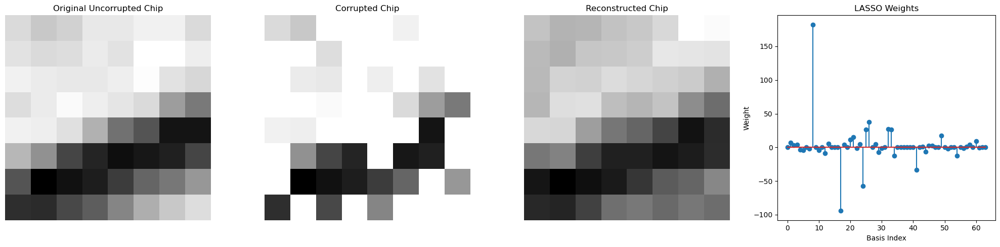

In [169]:
reconstructed_chip = np.zeros((image_size, image_size))
for idx in range(len(weights)):
    weight = weights[idx]
    basis_chip = basisv[:, idx].reshape(image_size, image_size)
    reconstructed_chip += weight * basis_chip

# Display the original uncorrupted chip, corrupted chip, and reconstructed chip
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Load the original uncorrupted chip
path = '../assets/boat-8x8-xy-star.npy'
uncorrupted_chip = np.load(path)

# Plot the original uncorrupted chip
axes[0].imshow(uncorrupted_chip, cmap="gray")
axes[0].set_title("Original Uncorrupted Chip")
axes[0].axis("off")

# Plot the corrupted chip
axes[1].imshow(corrupt_chip, cmap="gray")
axes[1].set_title("Corrupted Chip")
axes[1].axis("off")

# Plot the reconstructed chip
axes[2].imshow(reconstructed_chip, cmap="gray")
axes[2].set_title("Reconstructed Chip")
axes[2].axis("off")

# Plot the LASSO weights
axes[3].stem(weights)
axes[3].set_title("LASSO Weights")
axes[3].set_xlabel("Basis Index")
axes[3].set_ylabel("Weight")

plt.tight_layout()
plt.show()

# Whole-image reconstruction strategy

In [180]:
def basis_chip(P,Q,u,v):
    x = np.arange(1,P+1)
    y = np.arange(1,Q+1)
    
    X,Y = np.meshgrid(x,y)
    
    # normalizing vector
    alpha_u = np.sqrt(1/P) if u==1 else np.sqrt(2/P)
    beta_v = np.sqrt(1/Q) if v==1 else np.sqrt(2/Q)
    
    chip = alpha_u*beta_v*np.cos((np.pi*((2*X)-1)*(u-1))/(2*P))*np.cos((np.pi*((2*Y)-1)*(v-1))/(2*Q))
    
    return chip
    
    

In [182]:
def generate_sensed_pixels_in_block(img_block, sensed_pixels):
    """
    Randomly selects a subset of pixels in a block and sets their values to NaN.

    Args:
        img_block (numpy.ndarray): A 2D array representing the image block.
        sensed_pixels (int): The number of pixels to keep (not set to NaN).

    Returns:
        numpy.ndarray: The modified image block with sensed pixels set to NaN.
    """
    block_height, block_width = img_block.shape

    # Ensure sensed_pixels does not exceed the total number of pixels in the block
    if sensed_pixels > (block_height * block_width):
        raise ValueError("sensed_pixels cannot be greater than the total number of pixels in the block.")

    # Randomly select pixels to corrupt
    corrupted_pixels = [divmod(ele, block_height) for ele in rnd.sample(range((block_height) * (block_height)), (block_height * block_width) - sensed_pixels)]

    img_block = img_block.astype(float).copy()

    for pixel in corrupted_pixels:
        img_block[pixel[0], pixel[1]] = np.nan

    return img_block

In [183]:
def basis_vector_matrix(P,Q,uv_orientation=False):
    basis_vector = np.zeros((P**2,1))
    
    if not uv_orientation:
        for vx in range(1,Q+1):
            for uy in range(1,P+1):
                chip = basis_chip(P,Q,uy,vx)
                rasterized_chip = chip.flatten(order='F')
                basis_vector = np.column_stack((basis_vector,rasterized_chip))
    else:
        for uy in range(1,Q+1):
            for vx in range(1,P+1):
                chip = basis_chip(P,Q,uy,vx)
                rasterized_chip = chip.flatten(order='F')
                basis_vector = np.column_stack((basis_vector,rasterized_chip))
    
    basis_vector = basis_vector[:,1:]
    
    return basis_vector

In [184]:
def recover_block(block, basis_matrix, lambda_value=0.01):
    """
    Recover corrupted pixels in a block using Lasso.
    """
    # Flatten the block and find valid (uncorrupted) pixels
    y_flat = block.flatten()
    valid_indices = ~np.isnan(y_flat)
    corrupted_indices = np.isnan(y_flat)

    # Prepare data for Lasso
    X = basis_matrix[valid_indices, :]
    y = y_flat[valid_indices]

    # Fit Lasso model
    lasso = Lasso(alpha=lambda_value)
    lasso.fit(X, y)

    # Predict corrupted pixels
    X_corrupt = basis_matrix[corrupted_indices, :]
    y_corrupt = lasso.predict(X_corrupt)

    # Fill in the corrupted pixels
    y_flat[corrupted_indices] = y_corrupt
    recovered_block = y_flat.reshape(block.shape)

    return recovered_block

In [185]:
def reconstruct_from_blocks(blocks, original_shape, block_shape):
    """
    Reconstruct the full image from processed blocks.
    """
    reconstructed = np.zeros(original_shape)
    for i in range(blocks.shape[0]):
        for j in range(blocks.shape[1]):
            reconstructed[i * block_shape[0]:(i + 1) * block_shape[0],
                          j * block_shape[1]:(j + 1) * block_shape[1]] = blocks[i, j]
    return reconstructed

In [186]:
img_path_fishing_boat = '../assets/fishing_boat.bmp'
img_fishing_boat = mpimg.imread(img_path_fishing_boat)

In [187]:
k = 8
block_shape = (k,k)
height, width = img_fishing_boat.shape
sensed_pixels = 30

In [188]:
blocks = view_as_windows(img_fishing_boat, block_shape, step=1)
print("Shape of extracted blocks:", blocks.shape)

Shape of extracted blocks: (193, 185, 8, 8)


In [189]:
P, Q = block_shape
basis_matrix = basis_vector_matrix(P, Q)

In [200]:
recovered_blocks = np.zeros_like(blocks)
corrupted_blocks = np.zeros_like(blocks)
for i in range(blocks.shape[0]):
    for j in range(blocks.shape[1]):
        block = blocks[i, j].copy()

        # Corrupt pixels in the block
        block_corrupted = generate_sensed_pixels_in_block(block, sensed_pixels)
        corrupted_blocks[i,j] = block_corrupted

        # Recover corrupted pixels using Lasso
        block_recovered = recover_block(block_corrupted, basis_matrix, lambda_value=best_alpha)
        recovered_blocks[i, j] = block_recovered

/var/folders/r5/m5977dy13hd_9klxgsmylm740000gn/T/ipykernel_46739/818252685.py:9: RuntimeWarning: invalid value encountered in cast
  corrupted_blocks[i,j] = block_corrupted
/var/folders/r5/m5977dy13hd_9klxgsmylm740000gn/T/ipykernel_46739/818252685.py:9: RuntimeWarning: invalid value encountered in cast
  corrupted_blocks[i,j] = block_corrupted
/var/folders/r5/m5977dy13hd_9klxgsmylm740000gn/T/ipykernel_46739/818252685.py:9: RuntimeWarning: invalid value encountered in cast
  corrupted_blocks[i,j] = block_corrupted
/var/folders/r5/m5977dy13hd_9klxgsmylm740000gn/T/ipykernel_46739/818252685.py:9: RuntimeWarning: invalid value encountered in cast
  corrupted_blocks[i,j] = block_corrupted
/var/folders/r5/m5977dy13hd_9klxgsmylm740000gn/T/ipykernel_46739/818252685.py:9: RuntimeWarning: invalid value encountered in cast
  corrupted_blocks[i,j] = block_corrupted
/var/folders/r5/m5977dy13hd_9klxgsmylm740000gn/T/ipykernel_46739/818252685.py:9: RuntimeWarning: invalid value encountered in cast
  co

In [194]:
recovered_blocks.shape

(193, 185, 8, 8)

In [201]:
corrupted_blocks.shape

(193, 185, 8, 8)

In [202]:
def reconstruct_from_overlapping_blocks(recovered_blocks, original_shape):
    """
    Reconstruct the original image from overlapping blocks.

    Args:
        recovered_blocks (numpy.ndarray): Array of shape (num_blocks_h, num_blocks_w, block_h, block_w).
        original_shape (tuple): Shape of the original image (height, width).

    Returns:
        numpy.ndarray: Reconstructed image of shape `original_shape`.
    """
    # Initialize accumulator and counter
    accumulator = np.zeros(original_shape, dtype=np.float64)
    counter = np.zeros(original_shape, dtype=np.float64)

    # Get block dimensions
    block_h, block_w = recovered_blocks.shape[2], recovered_blocks.shape[3]

    # Iterate over each block and add to the accumulator
    for i in range(recovered_blocks.shape[0]):
        for j in range(recovered_blocks.shape[1]):
            # Get the current block
            block = recovered_blocks[i, j]

            # Define the region in the accumulator where this block will be added
            h_start = i
            h_end = h_start + block_h
            w_start = j
            w_end = w_start + block_w

            # Add the block to the accumulator
            accumulator[h_start:h_end, w_start:w_end] += block

            # Increment the counter for the overlapping region
            counter[h_start:h_end, w_start:w_end] += 1

    # Avoid division by zero (in case some pixels were not covered by any block)
    counter[counter == 0] = 1

    # Compute the average for each pixel
    reconstructed_image = accumulator / counter

    return reconstructed_image

In [203]:
def reconstruct_corrupted_image(corrupted_blocks, original_shape):
    """
    Reconstruct the corrupted image from overlapping blocks, handling NaN values.

    Args:
        corrupted_blocks (numpy.ndarray): Array of shape (num_blocks_h, num_blocks_w, block_h, block_w).
        original_shape (tuple): Shape of the original image (height, width).

    Returns:
        numpy.ndarray: Reconstructed corrupted image of shape `original_shape`.
    """
    # Initialize accumulator and counter
    accumulator = np.zeros(original_shape, dtype=np.float64)
    counter = np.zeros(original_shape, dtype=np.float64)

    # Get block dimensions
    block_h, block_w = corrupted_blocks.shape[2], corrupted_blocks.shape[3]

    # Iterate over each block and add to the accumulator
    for i in range(corrupted_blocks.shape[0]):
        for j in range(corrupted_blocks.shape[1]):
            # Get the current block
            block = corrupted_blocks[i, j]

            # Define the region in the accumulator where this block will be added
            h_start = i
            h_end = h_start + block_h
            w_start = j
            w_end = w_start + block_w

            # Create a mask for non-NaN pixels in the block
            valid_mask = ~np.isnan(block)

            # Add the valid pixels to the accumulator
            accumulator[h_start:h_end, w_start:w_end][valid_mask] += block[valid_mask]

            # Increment the counter for the valid pixels
            counter[h_start:h_end, w_start:w_end][valid_mask] += 1

    # Avoid division by zero (in case some pixels were not covered by any valid block)
    counter[counter == 0] = np.nan

    # Compute the average for each pixel
    reconstructed_image = accumulator / counter

    return reconstructed_image

In [204]:
reconstructed_image = reconstruct_from_overlapping_blocks(recovered_blocks, original_shape=img_fishing_boat.shape)
corrupted_image = reconstruct_corrupted_image(corrupted_blocks,original_shape=img_fishing_boat.shape)

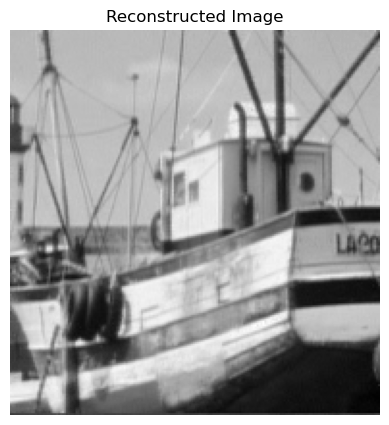

In [199]:
plt.figure(figsize=(10, 5))
plt.imshow(reconstructed_image, cmap='gray')
plt.title("Reconstructed Image")
plt.axis("off")
plt.show()

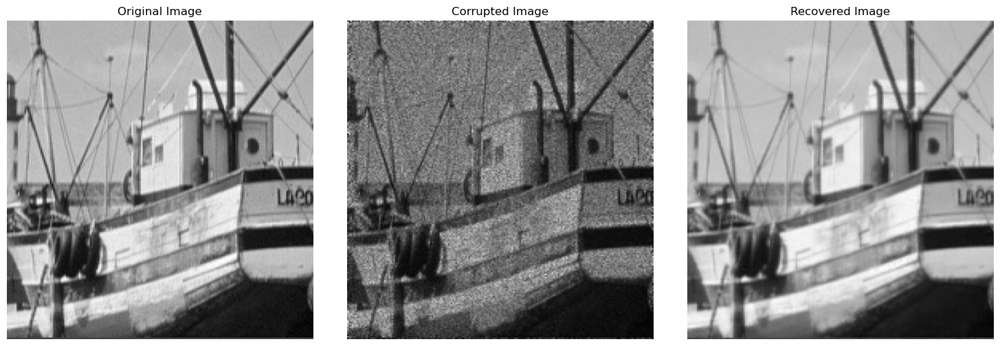

In [205]:
plt.figure(figsize=(15, 5))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(img_fishing_boat, cmap='gray')
plt.title("Original Image")
plt.axis("off")

# Corrupted Image
plt.subplot(1, 3, 2)
plt.imshow(corrupted_image, cmap='gray')
plt.title("Corrupted Image")
plt.axis("off")

# Recovered Image
plt.subplot(1, 3, 3)
plt.imshow(reconstructed_image, cmap='gray')
plt.title("Recovered Image")
plt.axis("off")

plt.tight_layout()
plt.show()